<a href="https://colab.research.google.com/github/hopeof-Greatmind/Object-Detection-Yolov5s_custumizedtraining/blob/main/ComputerVision_YoloV5onnx_carddata_IVPL_2025.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# 파이토치 버전의 YOLO 모델 version 5 소스 코드를 다운로드

!git clone https://github.com/ultralytics/yolov5  # clone
%cd yolov5
!pip install -r requirements.txt  # install

Cloning into 'yolov5'...
remote: Enumerating objects: 17968, done.
remote: Counting objects: 100% (92/92), done.
remote: Compressing objects: 100% (57/57), done.
remote: Total 17968 (delta 73), reused 35 (delta 35), pack-reused 17876 (from 3)
Receiving objects: 100% (17968/17968), 17.13 MiB | 20.19 MiB/s, done.
Resolving deltas: 100% (12233/12233), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 37.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 131.1/131.1 kB 13.8 MB/s eta 0:00:00
  Attempting uninstall: urllib3
    Found existing installation: urllib3 2.5.0
    Uninstalling urllib3-2.5.0:
      Successfully uninstalled urllib3-2.5.0


In [2]:
ls -al

total 464
drwxr-xr-x 10 root root  4096 May 19 04:31 ./
drwxr-xr-x  1 root root  4096 May 19 04:31 ../
-rw-r--r--  1 root root 14036 May 19 04:31 benchmarks.py
-rw-r--r--  1 root root   393 May 19 04:31 CITATION.cff
drwxr-xr-x  2 root root  4096 May 19 04:31 classify/
-rw-r--r--  1 root root  5419 May 19 04:31 CONTRIBUTING.md
drwxr-xr-x  5 root root  4096 May 19 04:31 data/
-rw-r--r--  1 root root 23985 May 19 04:31 detect.py
-rw-r--r--  1 root root  3701 May 19 04:31 .dockerignore
-rw-r--r--  1 root root 68544 May 19 04:31 export.py
drwxr-xr-x  8 root root  4096 May 19 04:31 .git/
-rw-r--r--  1 root root    75 May 19 04:31 .gitattributes
drwxr-xr-x  4 root root  4096 May 19 04:31 .github/
-rwxr-xr-x  1 root root  4010 May 19 04:31 .gitignore*
-rw-r--r--  1 root root 24051 May 19 04:31 hubconf.py
-rw-r--r--  1 root root 34523 May 19 04:31 LICENSE
drwxr-xr-x  4 root root  4096 May 19 04:31 models/
-rw-r--r--  1 root root  5446 May 19 04:31 pyproject.toml
-rw-r--r--  1 root root 50025 Ma

In [3]:
# Roboflow에서 생성한 데이터셋을 다운로드
# 아래 코드의 문자열은 비어있음
# 로보플로의 본인 계정에서 생성한 코드를 사용할 것

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="MMQccvY9HKjgRLQzIwLO")
project = rf.workspace("bg-kim-sookmyung-ac-kr").project("pokercard_2023")
dataset = project.version(1).download("yolov5")

!ls

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.9/207.9 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 17.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 69.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 95.8 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.13.0.92
    Uninstalling opencv-python-headless-4.13.0.92:
      Successfully uninstalled opencv-python-headless-4.13.0.92
  Attempting uninstall: idna
    Found existing installation: idna 3.13
    Uninstalling idna-3.13:
      Successfully uninstalled idna-3.13
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to PokerCard_2023-1 in yolov5pytorch:: 100%|██████████| 525/525 [00:00<00:00, 8513.97it/s]


benchmarks.py	 detect.py   PokerCard_2023-1  segment	       val.py
CITATION.cff	 export.py   pyproject.toml    tests
classify	 hubconf.py  README.md	       train.py
CONTRIBUTING.md  LICENSE     README.zh-CN.md   tutorial.ipynb
data		 models      requirements.txt  utils


In [ ]:
# 로보플로에서 생성한 데이터셋을 다운로드
# 아래 코드의 문자열은 비어있음
# 로보플로의 본인 계정에서 생성한 코드를 사용할 것

#!pip install roboflow

#from roboflow import Roboflow
#rf = Roboflow(api_key="ju1RohdcF4YVd8r92TB3")
#project = rf.workspace("computervision-2kk2b").project("pokercard-f72h7")
#dataset = project.version(1).download("yolov5")

#!ls

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.3/63.3 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 19.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.2/72.2 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.0 MB/s eta 0:00:00
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pyparsing-3.1.1:
      Successfully uninstalled pyparsing-3.1.1
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.8.1.78
    Uninstalling opencv-python-headless-4.8.1.78:
      Successfully uninstalled opencv-python-headless-4.8.1.78
  Attempting uninstall: idna
    Found existing 

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to PokerCard-1 in yolov5pytorch:: 100%|██████████| 158/158 [00:00<00:00, 6984.47it/s]


benchmarks.py  CONTRIBUTING.md	export.py   models	 README.zh-CN.md   setup.cfg	   utils
CITATION.cff   data		hubconf.py  PokerCard-1  requirements.txt  train.py	   val.py
classify       detect.py	LICENSE     README.md	 segment	   tutorial.ipynb


In [4]:
# 사전 학습된 weight 파일을 다운로드

!wget https://github.com/ultralytics/yolov5/releases/download/v7.0/yolov5s.pt
!ls

--2026-05-19 04:33:01--  https://github.com/ultralytics/yolov5/releases/download/v7.0/yolov5s.pt
Resolving github.com (github.com)... 140.82.116.4
Connecting to github.com (github.com)|140.82.116.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/264818686/381bd8a8-8910-4e9e-b0dd-2752951ef78c?sp=r&sv=2018-11-09&sr=b&spr=https&se=2026-05-19T05%3A12%3A23Z&rscd=attachment%3B+filename%3Dyolov5s.pt&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2026-05-19T04%3A11%3A49Z&ske=2026-05-19T05%3A12%3A23Z&sks=b&skv=2018-11-09&sig=W1eyw21ZxoITyUbRcYj05x9C6QJjgFs0eCKUfn%2FDVg8%3D&jwt=eyJ0eXAiOiJKV1QiLCJhbGciOiJIUzI1NiJ9.eyJpc3MiOiJnaXRodWIuY29tIiwiYXVkIjoicmVsZWFzZS1hc3NldHMuZ2l0aHVidXNlcmNvbnRlbnQuY29tIiwia2V5Ijoia2V5MSIsImV4cCI6MTc3OTE2Njk4MSwibmJmIjoxNzc5MTY1MTgxLCJwYXRoIjoicmVsZWFzZWFzc2V0cHJvZHVjdGlvbi5ibG9iLmNvcmUud

In [5]:
!ls -al

total 14932
drwxr-xr-x 11 root root     4096 May 19 04:33 .
drwxr-xr-x  1 root root     4096 May 19 04:31 ..
-rw-r--r--  1 root root    14036 May 19 04:31 benchmarks.py
-rw-r--r--  1 root root      393 May 19 04:31 CITATION.cff
drwxr-xr-x  2 root root     4096 May 19 04:31 classify
-rw-r--r--  1 root root     5419 May 19 04:31 CONTRIBUTING.md
drwxr-xr-x  5 root root     4096 May 19 04:31 data
-rw-r--r--  1 root root    23985 May 19 04:31 detect.py
-rw-r--r--  1 root root     3701 May 19 04:31 .dockerignore
-rw-r--r--  1 root root    68544 May 19 04:31 export.py
drwxr-xr-x  8 root root     4096 May 19 04:31 .git
-rw-r--r--  1 root root       75 May 19 04:31 .gitattributes
drwxr-xr-x  4 root root     4096 May 19 04:31 .github
-rwxr-xr-x  1 root root     4010 May 19 04:31 .gitignore
-rw-r--r--  1 root root    24051 May 19 04:31 hubconf.py
-rw-r--r--  1 root root    34523 May 19 04:31 LICENSE
drwxr-xr-x  4 root root     4096 May 19 04:31 models
drwxr-xr-x  5 root root     4096 May 19 04:32

In [6]:
!pwd

/content/yolov5


# Training stage: Train Yolo5 with your dataset

In [7]:
# 학습 단계
# --img     : 이미지 크기
# --batch   : 배치 크기
# --epochs  : 전체 학습 반복 횟수
# --data    : 데이터셋 경로 (data.yaml 파일은 로보플로에서 자동 생성됨)
# --weights : 이전에 학습된 weight 파일의 경로

#!python train.py --img 640 --batch 64 --epochs 300 --data PokerCard-1/data.yaml --weights yolov5s.pt
!python train.py --img 640 --batch 64 --epochs 300 --data PokerCard_2023-1/data.yaml --weights yolov5s.pt

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice: (30 second timeout) 
wandb: WARNING W&B disabled due to login timeout.
wandb: ERROR Error while calling W&B API: api key too short (<Response [401]>)
wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
train: weights=yolov5s.pt, cfg=, data=PokerCard_2023-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=64, imgsz=640, rect=False, resume=False

In [8]:
!ls -al

total 14940
drwxr-xr-x 13 root root     4096 May 19 04:35 .
drwxr-xr-x  1 root root     4096 May 19 04:31 ..
-rw-r--r--  1 root root    14036 May 19 04:31 benchmarks.py
-rw-r--r--  1 root root      393 May 19 04:31 CITATION.cff
drwxr-xr-x  2 root root     4096 May 19 04:31 classify
-rw-r--r--  1 root root     5419 May 19 04:31 CONTRIBUTING.md
drwxr-xr-x  5 root root     4096 May 19 04:31 data
-rw-r--r--  1 root root    23985 May 19 04:31 detect.py
-rw-r--r--  1 root root     3701 May 19 04:31 .dockerignore
-rw-r--r--  1 root root    68544 May 19 04:31 export.py
drwxr-xr-x  8 root root     4096 May 19 04:35 .git
-rw-r--r--  1 root root       75 May 19 04:31 .gitattributes
drwxr-xr-x  4 root root     4096 May 19 04:31 .github
-rwxr-xr-x  1 root root     4010 May 19 04:31 .gitignore
-rw-r--r--  1 root root    24051 May 19 04:31 hubconf.py
-rw-r--r--  1 root root    34523 May 19 04:31 LICENSE
drwxr-xr-x  5 root root     4096 May 19 04:34 models
drwxr-xr-x  5 root root     4096 May 19 04:32

In [9]:
# 학습 추세 확인
# 추세 및 가중치 파일은 runs/train/ 경로 아래에 exp 라는 이름의 디렉토리에 생성됨
# 학습을 중단 후 다시 시작하면 exp2, exp3, exp4, ... 와 같이 숫자를 붙여 생성됨

%load_ext tensorboard
%tensorboard --logdir runs/train

<IPython.core.display.Javascript object>

In [10]:
!ls -al runs/train/exp/

total 6376
drwxr-xr-x 3 root root    4096 May 19 05:02 .
drwxr-xr-x 3 root root    4096 May 19 04:35 ..
-rw-r--r-- 1 root root  118865 May 19 05:02 confusion_matrix.png
-rw-r--r-- 1 root root 1496367 May 19 05:02 events.out.tfevents.1779165325.a6a7a1108268.2379.0
-rw-r--r-- 1 root root  189791 May 19 05:02 F1_curve.png
-rw-r--r-- 1 root root     373 May 19 04:35 hyp.yaml
-rw-r--r-- 1 root root  223959 May 19 04:35 labels_correlogram.jpg
-rw-r--r-- 1 root root  165076 May 19 04:35 labels.jpg
-rw-r--r-- 1 root root    1116 May 19 04:35 opt.yaml
-rw-r--r-- 1 root root  178884 May 19 05:02 P_curve.png
-rw-r--r-- 1 root root  112278 May 19 05:02 PR_curve.png
-rw-r--r-- 1 root root  173356 May 19 05:02 R_curve.png
-rw-r--r-- 1 root root   88494 May 19 05:02 results.csv
-rw-r--r-- 1 root root  337898 May 19 05:02 results.png
-rw-r--r-- 1 root root  620744 May 19 04:35 train_batch0.jpg
-rw-r--r-- 1 root root  611910 May 19 04:35 train_batch1.jpg
-rw-r--r-- 1 root root  669896 May 19 04:35 trai

In [11]:
# 평가 단계
#!python detect.py --weight runs/train/exp/weights/best.pt --conf 0.1 --source PokerCard-1/valid/images
!python detect.py --weight runs/train/exp/weights/best.pt --conf 0.1 --source PokerCard_2023-1/valid/images

detect: weights=['runs/train/exp/weights/best.pt'], source=PokerCard_2023-1/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-484-g70b964b6 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs
image 1/21 /content/yolov5/PokerCard_2023-1/valid/images/IMG_2392_JPG.rf.5c58759f6fec5aae696eff67f98c7a54.jpg: 640x640 1 nine, 11.4ms
image 2/21 /content/yolov5/PokerCard_2023-1/valid/images/IMG_2399_JPG.rf.408d3dc0138ea5019c1c0f9f9e869e0b.jpg: 640x640 1 queen, 11.5ms
image 3/21 /content/yolov5/PokerCar

In [12]:
#Saved the best weight in "(/content/)yolov5/runs/train/exp/weights"
!ls -al /content/yolov5/runs/train/exp/weights

total 28272
drwxr-xr-x 2 root root     4096 May 19 04:35 .
drwxr-xr-x 3 root root     4096 May 19 05:02 ..
-rw-r--r-- 1 root root 14469551 May 19 05:02 best.pt
-rw-r--r-- 1 root root 14469551 May 19 05:02 last.pt


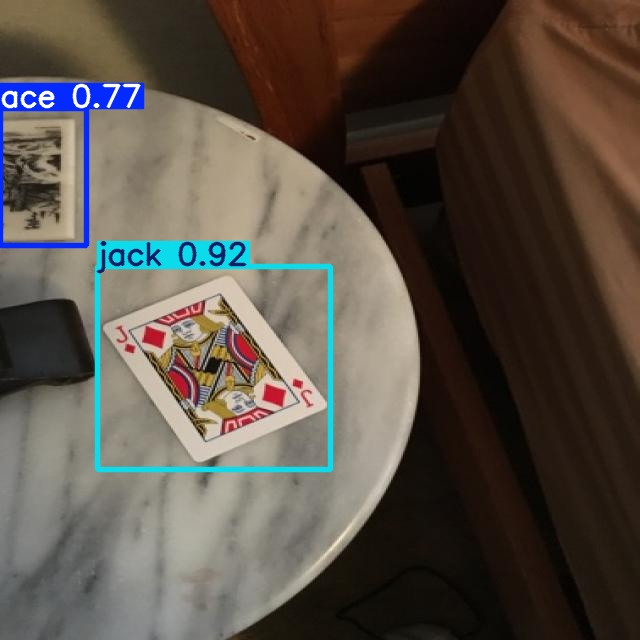

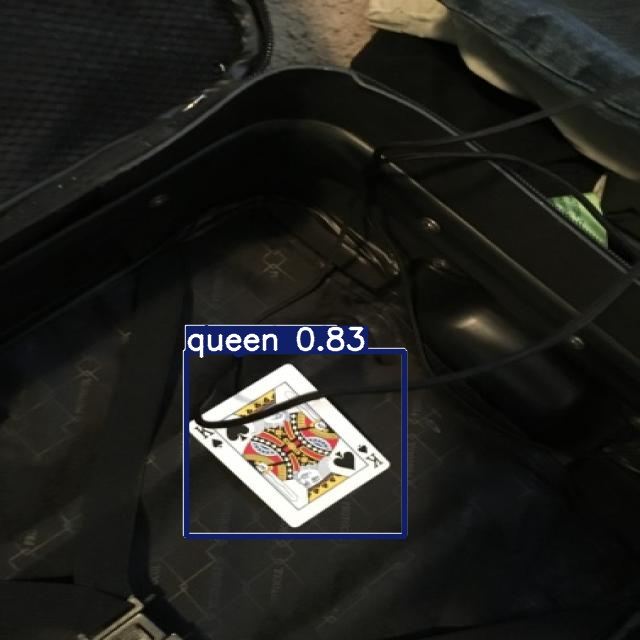

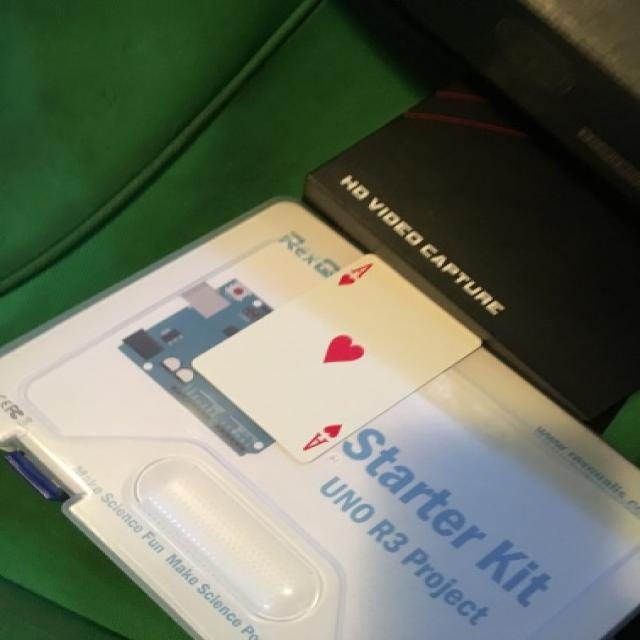

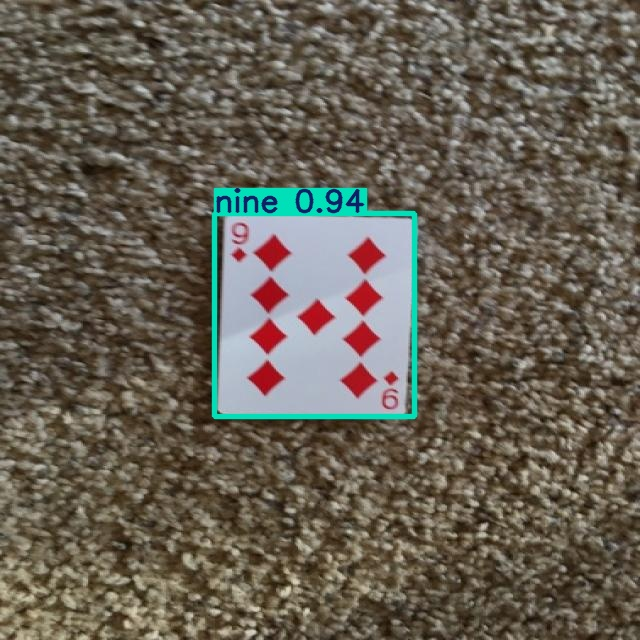

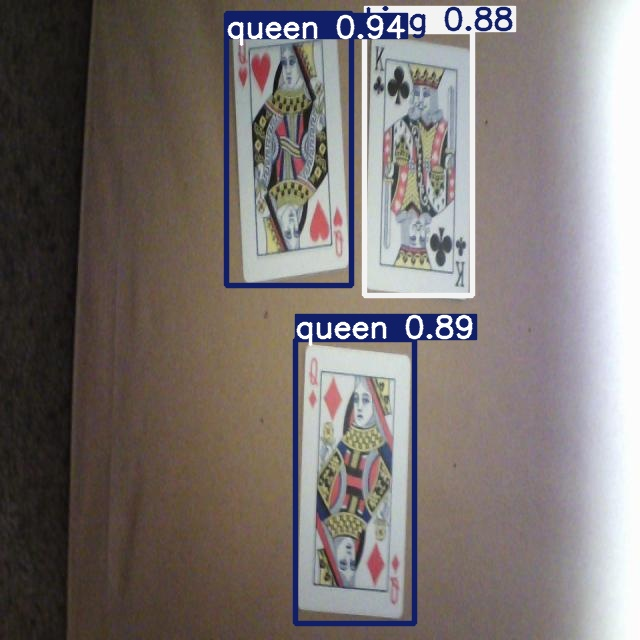

...

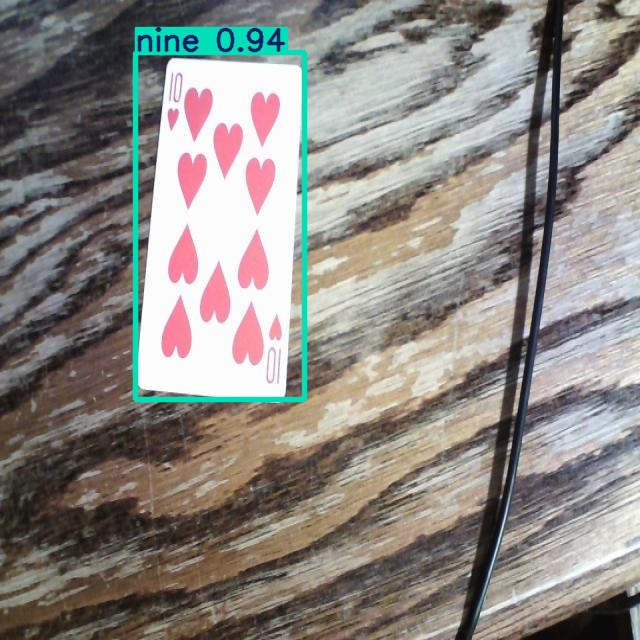

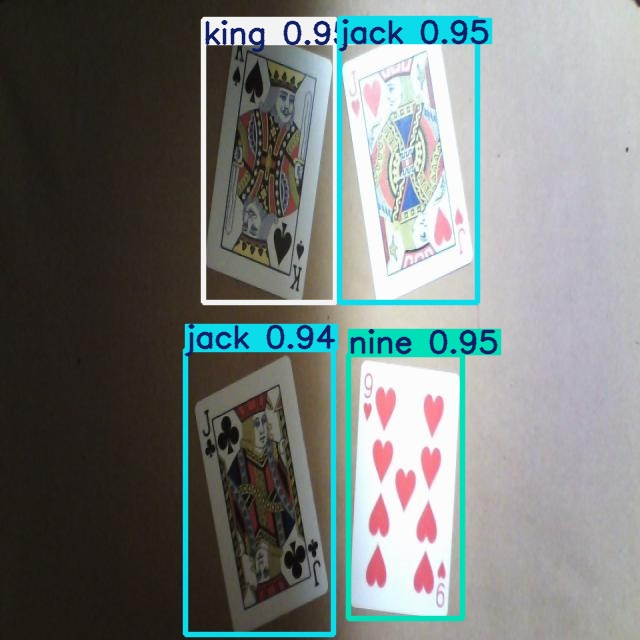

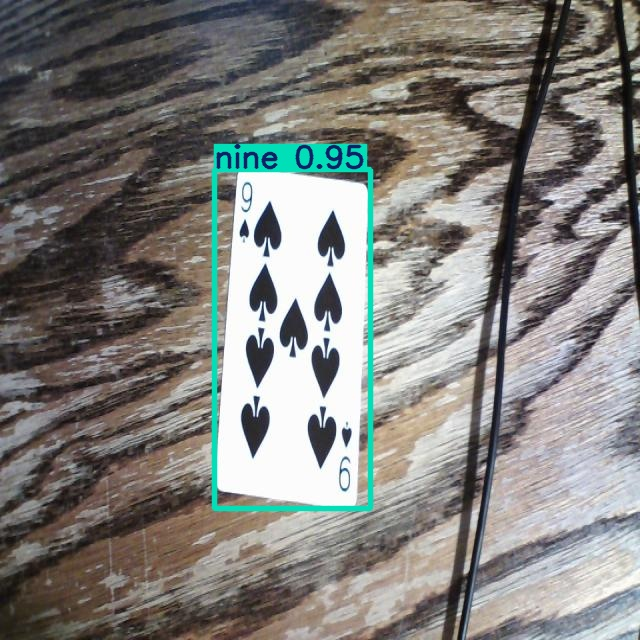

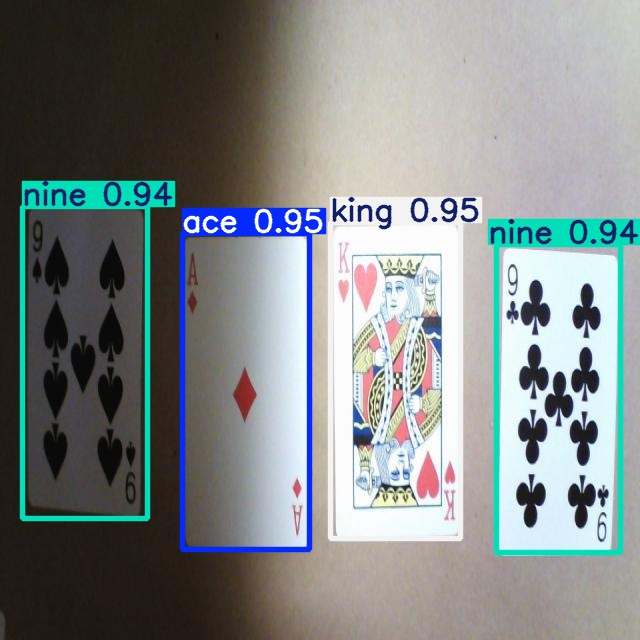

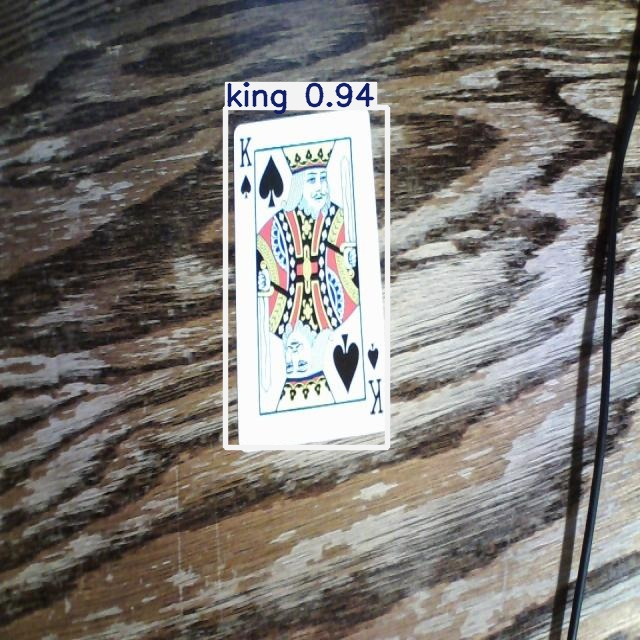

In [13]:
# 평가 결과를 시각화
import glob
from IPython.display import Image, display

for i, imageName in enumerate(glob.glob('runs/detect/exp/*.jpg')): #assuming JPG
    if i > 10:
      break
    display(Image(filename=imageName))
    print("\n")

In [1]:
# Install ONNX related librayies and modules
!pip install --upgrade setuptools pip --user
!pip install onnx
!pip install onnxruntime
#!pip install --ignore-installed PyYAML
#!pip install Pillow

!pip install protobuf<4.21.3
!pip install onnxruntime-gpu
!pip install onnx>=1.9.0
!pip install onnx-simplifier>=0.3.6 --user
!pip install ultralytics

  Using cached onnx-1.21.0-cp312-abi3-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (8.5 kB)
Using cached onnx-1.21.0-cp312-abi3-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl (17.6 MB)
  Using cached onnxruntime-1.26.0-cp312-cp312-manylinux_2_27_x86_64.manylinux_2_28_x86_64.whl.metadata (5.3 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 40.0 MB/s  0:00:00
/bin/bash: line 1: 4.21.3: No such file or directory
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 277.0/277.0 MB 35.1 MB/s  0:00:07
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [2]:
!cd ..
!ls /content/

'=0.3.6'  '=1.9.0'   sample_data   yolov5


In [12]:
import os

# Change to the yolov5 directory
%cd /content/yolov5/

# Export ONNX model with opset 18
!python export.py --weights runs/train/exp/weights/best.pt --include onnx --opset 18

/content/yolov5
export: data=data/coco128.yaml, weights=['runs/train/exp/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, per_tensor=False, dynamic=False, cache=, simplify=False, mlmodel=False, opset=18, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['onnx']
YOLOv5 🚀 v7.0-484-g70b964b6 Python-3.12.13 torch-2.10.0+cu128 CPU

Fusing layers... 
Model summary: 157 layers, 7026307 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from runs/train/exp/weights/best.pt with output shape (1, 25200, 11) (13.8 MB)

ONNX: starting export with onnx 1.21.0...
W0519 05:19:05.909000 14036 torch/onnx/_internal/exporter/_schemas.py:455] Missing annotation for parameter 'input' from (input, rois, spatial_scale: 'float', pooled_height: 'int', pooled_width: 'int', sampling_ratio: 'int' = -1, aligned: 'bool' = False). Treating as an In

In [13]:
# show ONNX model
!ls -al /content/yolov5/runs/train/exp/weights/

total 84276
drwxr-xr-x 2 root root     4096 May 19 05:14 .
drwxr-xr-x 3 root root     4096 May 19 05:02 ..
-rw-r--r-- 1 root root 28837762 May 19 05:19 best.onnx
-rw-r--r-- 1 root root 28508160 May 19 05:19 best.onnx.data
-rw-r--r-- 1 root root 14469551 May 19 05:02 best.pt
-rw-r--r-- 1 root root 14469551 May 19 05:02 last.pt


In [5]:
#---- Define processing functions -------#
import torchvision
import onnxruntime as ort
import time, random

img_size = 640

def box_iou(box1, box2, eps=1e-7):
        # https://github.com/pytorch/vision/blob/master/torchvision/ops/boxes.py
        """
        Return intersection-over-union (Jaccard index) of boxes.
        Both sets of boxes are expected to be in (x1, y1, x2, y2) format.
        Arguments:
            box1 (Tensor[N, 4])
            box2 (Tensor[M, 4])
        Returns:
            iou (Tensor[N, M]): the NxM matrix containing the pairwise
                IoU values for every element in boxes1 and boxes2
        """

        # inter(N,M) = (rb(N,M,2) - lt(N,M,2)).clamp(0).prod(2)
        (a1, a2), (b1, b2) = box1.unsqueeze(1).chunk(2, 2), box2.unsqueeze(0).chunk(2, 2)
        inter = (torch.min(a2, b2) - torch.max(a1, b1)).clamp(0).prod(2)

        # IoU = inter / (area1 + area2 - inter)
        return inter / ((a2 - a1).prod(2) + (b2 - b1).prod(2) - inter + eps)

def non_max_suppression(prediction,
            conf_thres,
            iou_thres,
            classes=None,
            agnostic=False,
            multi_label=False,
            labels=(),
            max_det=300,
            nm=0,  # number of masks
    ):
        """Non-Maximum Suppression (NMS) on inference results to reject overlapping detections

        Returns:
            list of detections, on (n,6) tensor per image [xyxy, conf, cls]
        """

        if isinstance(prediction, (list, tuple)):  # YOLOv5 model in validation model, output = (inference_out, loss_out)
            prediction = prediction[0]  # select only inference output

        device = prediction.device
        mps = 'mps' in device.type  # Apple MPS
        if mps:  # MPS not fully supported yet, convert tensors to CPU before NMS
            prediction = prediction.cpu()
        bs = prediction.shape[0]  # batch size
        nc = prediction.shape[2] - nm - 5  # number of classes
        xc = prediction[..., 4] > conf_thres  # candidates

        # Checks
        assert 0 <= conf_thres <= 1, f'Invalid Confidence threshold {conf_thres}, valid values are between 0.0 and 1.0'
        assert 0 <= iou_thres <= 1, f'Invalid IoU {iou_thres}, valid values are between 0.0 and 1.0'

        # Settings
        # min_wh = 2  # (pixels) minimum box width and height
        max_wh = 7680  # (pixels) maximum box width and height
        max_nms = 30000  # maximum number of boxes into torchvision.ops.nms()
        time_limit = 0.5 + 0.05 * bs  # seconds to quit after
        redundant = True  # require redundant detections
        multi_label &= nc > 1  # multiple labels per box (adds 0.5ms/img)
        merge = False  # use merge-NMS

        t = time.time()
        mi = 5 + nc  # mask start index
        output = [torch.zeros((0, 6 + nm), device=prediction.device)] * bs
        for xi, x in enumerate(prediction):  # image index, image inference
            # Apply constraints
            # x[((x[..., 2:4] < min_wh) | (x[..., 2:4] > max_wh)).any(1), 4] = 0  # width-height
            x = x[xc[xi]]  # confidence

            # Cat apriori labels if autolabelling
            if labels and len(labels[xi]):
                lb = labels[xi]
                v = torch.zeros((len(lb), nc + nm + 5), device=x.device)
                v[:, :4] = lb[:, 1:5]  # box
                v[:, 4] = 1.0  # conf
                v[range(len(lb)), lb[:, 0].long() + 5] = 1.0  # cls
                x = torch.cat((x, v), 0)

            # If none remain process next image
            if not x.shape[0]:
                continue

            # Compute conf
            x[:, 5:] *= x[:, 4:5]  # conf = obj_conf * cls_conf

            # Box/Mask
            box = xywh2xyxy(x[:, :4])  # center_x, center_y, width, height) to (x1, y1, x2, y2)
            mask = x[:, mi:]  # zero columns if no masks

            # Detections matrix nx6 (xyxy, conf, cls)
            if multi_label:
                i, j = (x[:, 5:mi] > conf_thres).nonzero(as_tuple=False).T
                x = torch.cat((box[i], x[i, 5 + j, None], j[:, None].float(), mask[i]), 1)
            else:  # best class only
                conf, j = x[:, 5:mi].max(1, keepdim=True)
                x = torch.cat((box, conf, j.float(), mask), 1)[conf.view(-1) > conf_thres]

            # Filter by class
            if classes is not None:
                x = x[(x[:, 5:6] == torch.tensor(classes, device=x.device)).any(1)]

            # Apply finite constraint
            # if not torch.isfinite(x).all():
            #     x = x[torch.isfinite(x).all(1)]

            # Check shape
            n = x.shape[0]  # number of boxes
            if not n:  # no boxes
                continue
            elif n > max_nms:  # excess boxes
                x = x[x[:, 4].argsort(descending=True)[:max_nms]]  # sort by confidence
            else:
                x = x[x[:, 4].argsort(descending=True)]  # sort by confidence

            # Batched NMS
            c = x[:, 5:6] * (0 if agnostic else max_wh)  # classes
            boxes, scores = x[:, :4] + c, x[:, 4]  # boxes (offset by class), scores
            i = torchvision.ops.nms(boxes, scores, iou_thres)  # NMS
            if i.shape[0] > max_det:  # limit detections
                i = i[:max_det]
            if merge and (1 < n < 3E3):  # Merge NMS (boxes merged using weighted mean)
                # update boxes as boxes(i,4) = weights(i,n) * boxes(n,4)
                iou = box_iou(boxes[i], boxes) > iou_thres  # iou matrix
                weights = iou * scores[None]  # box weights
                x[i, :4] = torch.mm(weights, x[:, :4]).float() / weights.sum(1, keepdim=True)  # merged boxes
                if redundant:
                    i = i[iou.sum(1) > 1]  # require redundancy

            output[xi] = x[i]
            if mps:
                output[xi] = output[xi].to(device)
            if (time.time() - t) > time_limit:
                # LOGGER.warning(f'WARNING ⚠️ NMS time limit {time_limit:.3f}s exceeded')
                break  # time limit exceeded

        return output


def xywh2xyxy(x):
        # Convert nx4 boxes from [x, y, w, h] to [x1, y1, x2, y2] where xy1=top-left, xy2=bottom-right
        y = torch.zeros_like(x) if isinstance(x, torch.Tensor) else np.zeros_like(x)
        y[:, 0] = x[:, 0] - x[:, 2] / 2  # top left x
        y[:, 1] = x[:, 1] - x[:, 3] / 2  # top left y
        y[:, 2] = x[:, 0] + x[:, 2] / 2  # bottom right x
        y[:, 3] = x[:, 1] + x[:, 3] / 2  # bottom right y
        return y

# Read classes.txt
def class_name():
        classes=['ace',	'jack',	'king',	'nine',	'queen','ten'
        ]
        return classes

def letterbox(im, color=(114, 114, 114), auto=True, scaleup=True, stride=32):
        # Resize and pad image while meeting stride-multiple constraints
        shape = im.shape[:2]  # current shape [height, width]
        new_shape= img_size
        if isinstance(new_shape, int):
            new_shape = (new_shape, new_shape)

        # Scale ratio (new / old)
        r = min(new_shape[0] / shape[0], new_shape[1] / shape[1])
        if not scaleup:  # only scale down, do not scale up (for better val mAP)
            r = min(r, 1.0)

        # Compute padding
        new_unpad = int(round(shape[1] * r)), int(round(shape[0] * r))
        dw, dh = new_shape[1] - new_unpad[0], new_shape[0] - new_unpad[1]  # wh padding

        if auto:  # minimum rectangle
            dw, dh = np.mod(dw, stride), np.mod(dh, stride)  # wh padding

        dw /= 2  # divide padding into 2 sides
        dh /= 2

        if shape[::-1] != new_unpad:  # resize
            im = cv2.resize(im, new_unpad, interpolation=cv2.INTER_LINEAR)
        top, bottom = int(round(dh - 0.1)), int(round(dh + 0.1))
        left, right = int(round(dw - 0.1)), int(round(dw + 0.1))
        im = cv2.copyMakeBorder(im, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)  # add border
        return im, r, (dw, dh)

# Initialize ONNXRuntime session
def ort_session(onnx_model):
        providers = ['CUDAExecutionProvider', 'CPUExecutionProvider'] if ort.get_device()=='GPU' else ['CPUExecutionProvider']
        session = ort.InferenceSession(onnx_model, providers=providers)
        print(session.get_providers())

        return session

# Display results
def result(img,ratio, dwdh, out):
        names= class_name()
        colors = {name:[random.randint(0, 255) for _ in range(3)] for i,name in enumerate(names)}
        for i,(x0,y0,x1,y1,score,cls_id) in enumerate(out):
            box = np.array([x0,y0,x1,y1])
            box -= np.array(dwdh*2)
            box /= ratio
            box = box.round().astype(np.int32).tolist()
            cls_id = int(cls_id)
            score = round(float(score),3)
            name = names[cls_id]
            color = colors[name]
            name += ' '+str(score)
            cv2.rectangle(img,box[:2],box[2:],color,2)
            cv2.putText(img,name,(box[0], box[1] - 2),cv2.FONT_HERSHEY_SIMPLEX,0.75,[225, 255, 255],thickness=2)
        return img
        # cv2.imwrite('v5_onnx.jpg', img)
        # cv2.imshow('result',img)
        # cv2.waitKey(0)

In [6]:
#Download a test image from my gdrive
from google.colab import drive
drive.mount('/content/drive')

!cp /content/drive/MyDrive/cam_image52.jpg .

Mounted at /content/drive


In [7]:
!ls -al

total 15096
drwxr-xr-x 13 root root     4096 May 19 05:15 .
drwxr-xr-x  1 root root     4096 May 19 05:15 ..
-rw-r--r--  1 root root    14036 May 19 04:31 benchmarks.py
-rw-------  1 root root   156014 May 19 05:15 cam_image52.jpg
-rw-r--r--  1 root root      393 May 19 04:31 CITATION.cff
drwxr-xr-x  2 root root     4096 May 19 04:31 classify
-rw-r--r--  1 root root     5419 May 19 04:31 CONTRIBUTING.md
drwxr-xr-x  5 root root     4096 May 19 04:31 data
-rw-r--r--  1 root root    23985 May 19 04:31 detect.py
-rw-r--r--  1 root root     3701 May 19 04:31 .dockerignore
-rw-r--r--  1 root root    68544 May 19 04:31 export.py
drwxr-xr-x  8 root root     4096 May 19 04:35 .git
-rw-r--r--  1 root root       75 May 19 04:31 .gitattributes
drwxr-xr-x  4 root root     4096 May 19 04:31 .github
-rwxr-xr-x  1 root root     4010 May 19 04:31 .gitignore
-rw-r--r--  1 root root    24051 May 19 04:31 hubconf.py
-rw-r--r--  1 root root    34523 May 19 04:31 LICENSE
drwxr-xr-x  5 root root     4096 May

['CUDAExecutionProvider', 'CPUExecutionProvider']
Predictions: tensor([[361.6720, 156.0734, 472.6136, 308.1829,   0.9129,   2.0000],
        [288.5401, 325.3368, 416.7914, 492.7313,   0.9125,   4.0000],
        [226.4619, 145.1794, 350.9783, 296.7877,   0.8979,   4.0000]])
yolov5 ONNXRuntime Inference Time: 0.46142005920410156


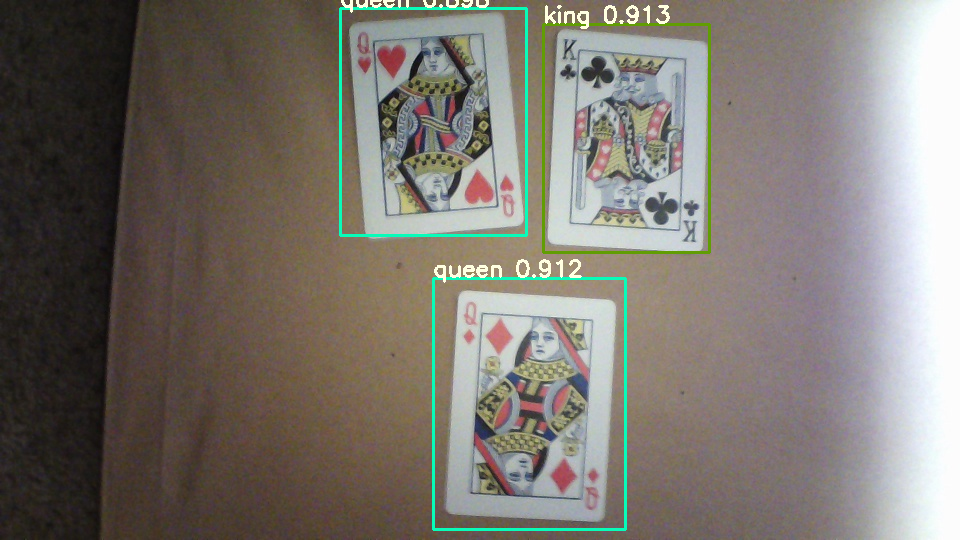

In [8]:
# Inference for ONNX model
import torch
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

cuda = True
w = "/content/yolov5/runs/train/exp/weights/best.onnx"
img = cv2.imread('/content/yolov5/cam_image52.jpg')
image, ratio, dwdh = letterbox(img, auto=False)
image = image.transpose((2, 0, 1))
image = np.expand_dims(image, 0)
image = np.ascontiguousarray(image)
im = image.astype(np.float32)
im /= 255

#onnxruntime session
session= ort_session(w)
outname = [i.name for i in session.get_outputs()]
inname = [i.name for i in session.get_inputs()]

# print('input-output names:',inname,outname)
inp = {inname[0]:im}

# ONNXRuntime inference
t1 = time.time()
outputs = session.run(outname, inp)[0]
t2 = time.time()
output= torch.from_numpy(outputs)
out = non_max_suppression(output, conf_thres=0.25, iou_thres=0.45)[0]
print('Predictions:',out)
print('yolov5 ONNXRuntime Inference Time:', t2-t1)
imgout=result(img,ratio, dwdh, out)
cv2.imwrite('result.jpg', imgout)
# print('result', img.shape)
# cv2.imshow('result',img)
# cv2.waitKey(0)
cv2_imshow(imgout)

In [11]:
#copy your xxx.onnx  file to your Google drive
!cp /content/yolov5/runs/train/exp/weights/best.onnx /content/drive/MyDrive/yolo5s_card_2026.onnx
!ls -al /content/drive/MyDrive

total 3396292
-rw------- 1 root root     59235 Oct 13  2024 '1. 2023년도 연구센터 평가결과보고서_양식_인공지능혁신연구센터.xlsx'
-rw------- 1 root root    170196 Nov 16  2018  1-s2.0-S0141938215000980-main.pdf
-rw------- 1 root root    287881 Sep 15  2020  20.09.10_사업자등록증_숙명여대산단.pdf
-rw------- 1 root root  32187457 Aug  3  2019 '2017-publication-9500-3차년도_중간점검(초안)(검토본).pptx'
-rw------- 1 root root  17600000 Mar 11  2020  2019-CONTEXT-9500-1차년도-연차보고서_김병규교수님연구실_수정본.hwp
-rw------- 1 root root  30789632 Jun 15  2021 '2021년 지역특화산업육성+(R&D)지역주력산업육성 최종평가 보고서-210615-수정본.hwp'
-rw------- 1 root root  68822016 Jan  7  2025 '2024-2 (일반형)캡스톤디자인 결과보고서 양식_김병규.hwp'
-rw------- 1 root root  59704203 Oct 23  2025 '[2024] 인공지능혁신연구센터 운영결과보고서.zip'
-rw------- 1 root root  73056256 Apr 17  2024 '240416_2024년_약자를_위한기술